# Phase 4 Project - Time Series Modeling 
By Kristen Davis 

# 1 - Notebook Set Up 

In [1]:
#import nessesary libraries 
import pandas as pd
import pandas.tseries  
import numpy as np  

import statsmodels.api as sm 
import itertools

import matplotlib.pyplot as plt   
from matplotlib.pylab import rcParams 
%matplotlib inline
plt.style.use('ggplot') 
import plotly.express as px
import plotly.figure_factory as ff 
import plotly.graph_objects as go 
import seaborn as sns  


import warnings
warnings.filterwarnings('ignore') 

from functions import *  

In [2]:
#load the data from teh zillow data set
df = pd.read_csv('zillow_data.csv') 

# 2 - EDA 
Data frame exploration

In [3]:
#preview the dataframe
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


In [4]:
#dataframe metadata
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14723 entries, 0 to 14722
Columns: 272 entries, RegionID to 2018-04
dtypes: float64(219), int64(49), object(4)
memory usage: 30.6+ MB


In [5]:
df.columns.to_list()

['RegionID',
 'RegionName',
 'City',
 'State',
 'Metro',
 'CountyName',
 'SizeRank',
 '1996-04',
 '1996-05',
 '1996-06',
 '1996-07',
 '1996-08',
 '1996-09',
 '1996-10',
 '1996-11',
 '1996-12',
 '1997-01',
 '1997-02',
 '1997-03',
 '1997-04',
 '1997-05',
 '1997-06',
 '1997-07',
 '1997-08',
 '1997-09',
 '1997-10',
 '1997-11',
 '1997-12',
 '1998-01',
 '1998-02',
 '1998-03',
 '1998-04',
 '1998-05',
 '1998-06',
 '1998-07',
 '1998-08',
 '1998-09',
 '1998-10',
 '1998-11',
 '1998-12',
 '1999-01',
 '1999-02',
 '1999-03',
 '1999-04',
 '1999-05',
 '1999-06',
 '1999-07',
 '1999-08',
 '1999-09',
 '1999-10',
 '1999-11',
 '1999-12',
 '2000-01',
 '2000-02',
 '2000-03',
 '2000-04',
 '2000-05',
 '2000-06',
 '2000-07',
 '2000-08',
 '2000-09',
 '2000-10',
 '2000-11',
 '2000-12',
 '2001-01',
 '2001-02',
 '2001-03',
 '2001-04',
 '2001-05',
 '2001-06',
 '2001-07',
 '2001-08',
 '2001-09',
 '2001-10',
 '2001-11',
 '2001-12',
 '2002-01',
 '2002-02',
 '2002-03',
 '2002-04',
 '2002-05',
 '2002-06',
 '2002-07',
 '2

In [6]:
df.isna().sum().to_list()

[0,
 0,
 0,
 0,
 1043,
 0,
 0,
 1039,
 1039,
 1039,
 1039,
 1039,
 1039,
 1039,
 1039,
 1039,
 1039,
 1039,
 1039,
 1039,
 1039,
 1039,
 1038,
 1038,
 1038,
 1038,
 1038,
 1038,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 1036,
 918,
 918,
 918,
 918,
 918,
 918,
 887,
 887,
 887,
 887,
 887,
 887,
 866,
 866,
 866,
 866,
 866,
 866,
 814,
 814,
 801,
 801,
 801,
 801,
 723,
 723,
 723,
 723,
 723,
 723,
 667,
 667,
 667,
 667,
 667,
 667,
 640,
 640,
 640,
 640,
 640,
 640,
 620,
 620,
 620,
 620,
 620,
 620,
 613,
 613,
 613,
 613,
 613,
 613,
 607,
 607,
 607,
 607,
 607,
 607,


In [7]:
#States represented by the data 
df['State'].unique()

array(['IL', 'TX', 'NY', 'CA', 'FL', 'TN', 'NC', 'GA', 'DC', 'MO', 'OK',
       'AZ', 'NJ', 'MD', 'VA', 'WA', 'OH', 'MI', 'MA', 'KS', 'NM', 'CT',
       'NV', 'PA', 'CO', 'OR', 'IN', 'SC', 'KY', 'AR', 'ND', 'MN', 'AL',
       'DE', 'LA', 'MS', 'ID', 'MT', 'HI', 'WI', 'UT', 'ME', 'SD', 'WV',
       'IA', 'RI', 'NE', 'WY', 'AK', 'NH', 'VT'], dtype=object)

In [8]:
#number of region ids by state
df.groupby('State').count()

,RegionID,RegionName,City,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,1996-07,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
State,,,,,,,,,,,,,,,,,,,,,
AK,28,28,28,22,28,28,28,28,28,28,...,28,28,28,28,28,28,28,28,28,28
AL,183,183,183,175,183,183,158,158,158,158,...,183,183,183,183,183,183,183,183,183,183
AR,105,105,105,100,105,105,97,97,97,97,...,105,105,105,105,105,105,105,105,105,105
AZ,230,230,230,228,230,230,215,215,215,215,...,230,230,230,230,230,230,230,230,230,230
CA,1224,1224,1224,1182,1224,1224,1188,1188,1188,1188,...,1224,1224,1224,1224,1224,1224,1224,1224,1224,1224
CO,249,249,249,229,249,249,247,247,247,247,...,249,249,249,249,249,249,249,249,249,249
CT,124,124,124,124,124,124,124,124,124,124,...,124,124,124,124,124,124,124,124,124,124
DC,18,18,18,18,18,18,18,18,18,18,...,18,18,18,18,18,18,18,18,18,18
DE,41,41,41,41,41,41,26,26,26,26,...,41,41,41,41,41,41,41,41,41,41


#### This data set contains:  
- 14722 enteries representing data on single family residential home sales, between 1996 & 2018  
- The following geographical identifier columns 'RegionID', 'RegionName', 'City', 'State', 'Metro', 'CountyName', & 'SizeRank' 
- Average home sale prices each month between the years 1996 & 2018
- Missing values in the 'Metro' identifier & a varying number of missing values between the years 1996 - 2014 (all rows missing values are less than 1,500 representing less than 10% of the data)
- Entries from all 50 states  
- A varying number of region ids represented for each state 

## 2.1 Narrowing the Scope of Project
InvestTex the client I am building a recomendation system for is interested in investing only in the Dallas/ Fort Worth Metroplex and thus I will need to limit to scope of my data. 

In [9]:
#drop rows with NAN values 
df.dropna(inplace=True)

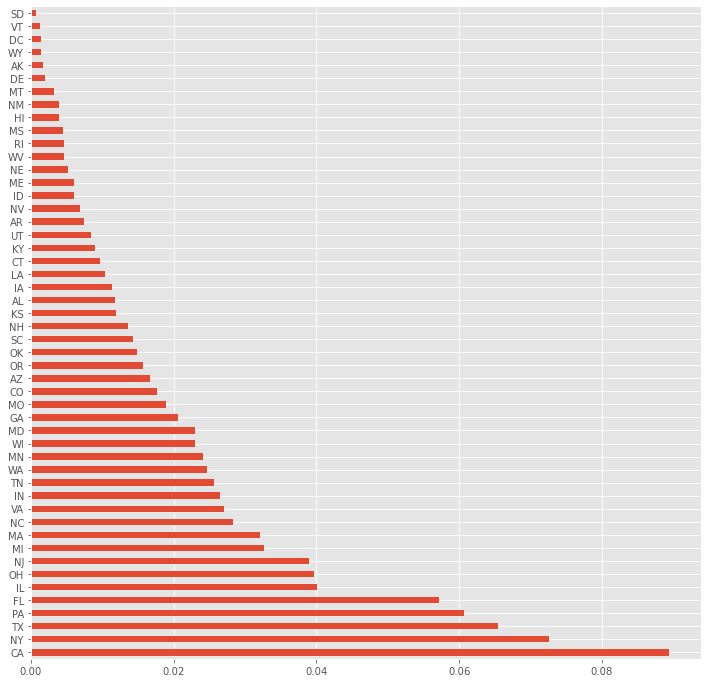

In [10]:
#look at the value counts for each state
df['State'].value_counts(1).plot(kind='barh', figsize=(12,12))   
plt.show()

In [11]:
#listings in Texas
texas = df.loc[df['State'] == 'TX']

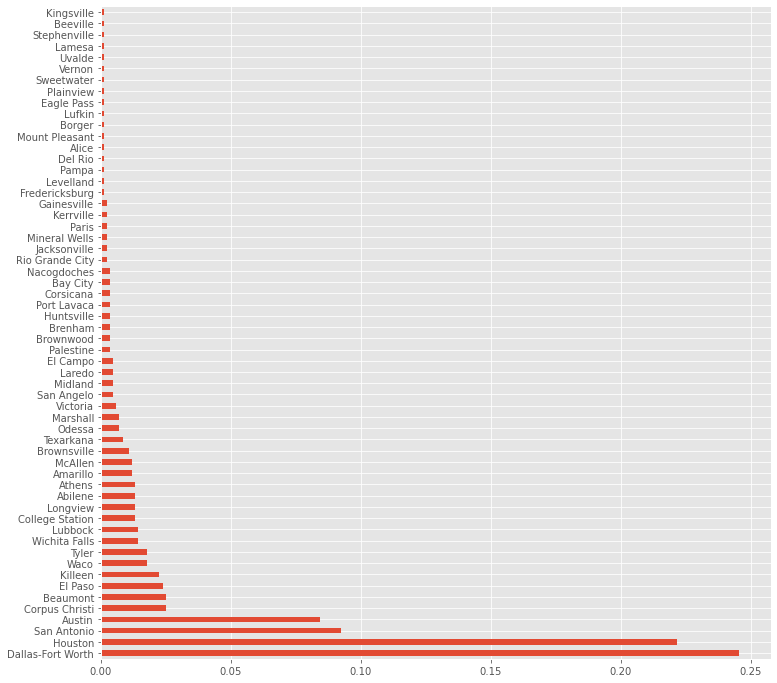

In [12]:
#look at the value counts for each city in Texas
texas['Metro'].value_counts(1).plot(kind='barh', figsize=(12,12))   
plt.show()

In [13]:
#listings in Dallas
dallas = texas.loc[texas['Metro'] == "Dallas-Fort Worth"] 
#preview data 
dallas

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
34,90654,75052,Grand Prairie,TX,Dallas-Fort Worth,Dallas,35,100800.0,100900.0,101000.0,...,186700,188200,189700,191400,193000,194300,195200,196700,199100,201100
52,90637,75034,Frisco,TX,Dallas-Fort Worth,Collin,53,285200.0,287600.0,289500.0,...,408700,411000,414300,418000,421600,423000,422800,424000,427600,430200
54,90823,75287,Dallas,TX,Dallas-Fort Worth,Dallas,55,184400.0,183300.0,182400.0,...,319600,322300,325000,325900,326200,326700,328000,330800,333900,335100
69,90795,75243,Dallas,TX,Dallas-Fort Worth,Dallas,70,136500.0,136400.0,136400.0,...,279900,280900,280900,281700,283300,286400,290200,293600,295600,296100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12567,90892,75422,Campbell,TX,Dallas-Fort Worth,Hunt,12568,74000.0,74200.0,74500.0,...,105400,107500,108900,109500,110300,111600,112700,113900,115400,117200
12598,90893,75423,Celeste,TX,Dallas-Fort Worth,Hunt,12599,55700.0,56100.0,56400.0,...,84000,84400,85500,86400,87700,88300,88700,88800,89000,89000
13271,91239,76093,Rio Vista,TX,Dallas-Fort Worth,Johnson,13272,70000.0,70200.0,70300.0,...,137100,135400,135900,137700,137400,137200,138200,141300,145100,147600
13312,91179,76005,Arlington,TX,Dallas-Fort Worth,Tarrant,13313,200100.0,200000.0,199800.0,...,388700,386400,383300,379400,375100,374200,374200,373700,373900,373900


In [14]:
#identify unique counties to find FIP codes 
dallas['CountyName'].unique()

array(['Collin', 'Dallas', 'Denton', 'Johnson', 'Tarrant', 'Kaufman',
       'Ellis', 'Rockwall', 'Hood', 'Parker', 'Hunt', 'Somervell'],
      dtype=object)

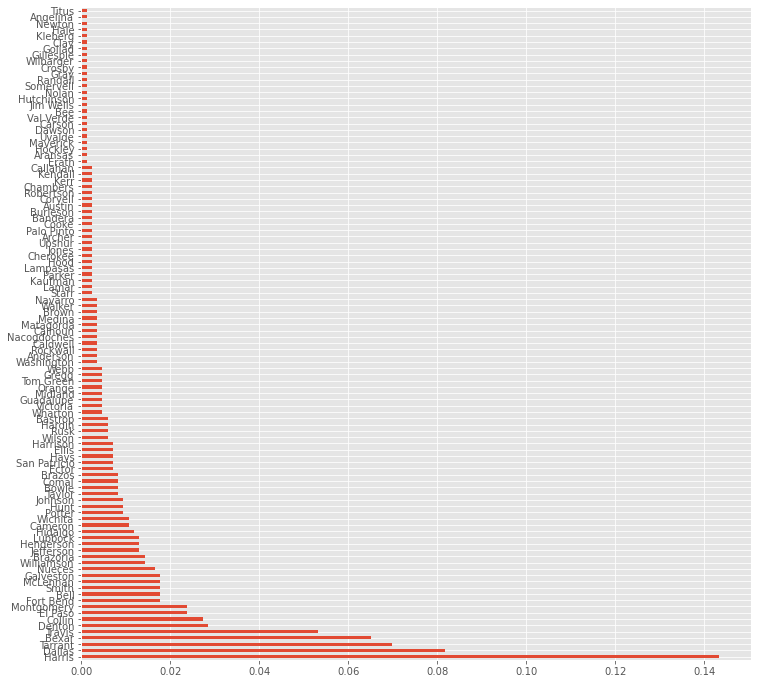

In [15]:
#look at the value counts for each county in the dallas metroplex
texas['CountyName'].value_counts(1).plot(kind='barh', figsize=(12,12))   
plt.show()

In [16]:
#visualize the dallas /ft worth metroplex
fips = ['48085', '48113', '48121', '48251', '48439', '48257', '48139', '48397', '48221', '48367', '48231', '48425']
values = range(len(fips)) 

fig = ff.create_choropleth(fips=fips, values=values, scope=['Texas'], 
                           county_outline={'color': 'rgb(15, 15, 55)', 'width': 0.5}, 
                           state_outline={'color': 'rgb(15, 15, 55)', 'width': 1},
                           title='Counties of Investment Interest')
fig.layout.template = None
fig.show() 

In [17]:
#get the number of zipcodes represented by County Name 
dallas.groupby('CountyName').count()

,RegionID,RegionName,City,State,Metro,SizeRank,1996-04,1996-05,1996-06,1996-07,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
CountyName,,,,,,,,,,,,,,,,,,,,,
Collin,23,23,23,23,23,23,23,23,23,23,...,23,23,23,23,23,23,23,23,23,23
Dallas,69,69,69,69,69,69,69,69,69,69,...,69,69,69,69,69,69,69,69,69,69
Denton,24,24,24,24,24,24,24,24,24,24,...,24,24,24,24,24,24,24,24,24,24
Ellis,6,6,6,6,6,6,6,6,6,6,...,6,6,6,6,6,6,6,6,6,6
Hood,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
Hunt,8,8,8,8,8,8,8,8,8,8,...,8,8,8,8,8,8,8,8,8,8
Johnson,8,8,8,8,8,8,8,8,8,8,...,8,8,8,8,8,8,8,8,8,8
Kaufman,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
Parker,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2


In [18]:
labels = ['Collin', 'Dallas', 'Denton', 'Johnson', 'Tarrant', 'Kaufman',
       'Ellis', 'Rockwall', 'Hood', 'Parker', 'Hunt', 'Somervell']
values = [23, 69, 24, 8, 59, 2, 6, 3, 2, 2, 8, 1]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='percent',
                             insidetextorientation='radial'
                            )])
fig.show()

In [19]:
#list out zipcodes in the metroplex
dallas['RegionName'].unique()

array([75070, 75052, 75034, 75287, 75243, 75067, 76028, 76063, 75228,
       76244, 75056, 75217, 75206, 75035, 75150, 76116, 75043, 75002,
       75211, 75204, 76179, 76137, 76051, 75098, 75115, 75093, 75040,
       75007, 75149, 75061, 75025, 75231, 76133, 75068, 75080, 75071,
       76010, 75074, 75219, 75023, 75024, 75227, 75063, 75006, 75062,
       76112, 76017, 75214, 75248, 76039, 75104, 76108, 75019, 75126,
       75165, 75050, 75013, 76021, 75044, 75028, 76107, 76119, 75060,
       76180, 75075, 76262, 75154, 75081, 75220, 76210, 75069, 75038,
       76248, 75087, 76006, 76013, 75077, 76065, 75230, 76132, 76131,
       75252, 76227, 75238, 75051, 75033, 76049, 76053, 75234, 75254,
       75042, 75229, 75010, 76182, 76117, 76040, 76016, 75039, 76048,
       76087, 75032, 76014, 76020, 76012, 75224, 75218, 76033, 75241,
       75089, 76001, 76109, 76011, 76123, 76201, 75189, 76209, 75232,
       75205, 76226, 75041, 76140, 76092, 75225, 76036, 75160, 76002,
       76114, 76126,

## 2.2 - Filter Data Using School Grade Filter

There are still 207 rows of housing data that fall within the Dallas/ Fort Worth - one of the defined metrics I will be using to recommend the best investment zipcodes are ones that fall within good school districts. School district preformance is a powerful predictor of housing value so I will group zipcodes by school district and then select only those zipcodes that fall into high preforming school districts (A-/A/A+)

In [20]:
#visualize distribution of school district grades in the metroplex  
grades=['A+', 'A', 'A-', 'B+', 'B', 'B-', 'C+', 'C', 'C-'] 

fig = go.Figure([go.Bar(x=grades, y=[17, 36, 22, 30, 26, 48, 17, 8, 1])]) 
fig.update_layout(
    title='Frequency Listing by of School District Grade',
    xaxis=dict(
        title='School District Grade',
        titlefont_size=16,
        tickfont_size=14,
    ),
    yaxis=dict(
        title='Number of Zipcodes',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)
fig.show()

In [21]:
#slice zipcodes in school districts with A+/A/A-  
low_zipcodes = [76227, 76020, 76135, 76028, 75287, 75007, 75006, 75234, 75423, 75119, 75126, 75043, 75040, 75044,
                75042, 75089, 75041, 75088, 76059, 75065, 75453, 75407, 76259, 75243, 75080, 75248, 75081, 75238, 
                75496, 76010, 76012, 76005, 76006, 76013, 76016, 76011, 76014, 76015, 76018, 75442, 76049, 76048, 
                75050, 75051, 76017, 76060, 75068, 75150, 75149, 75180, 75181, 75253, 75189, 76087, 76108, 75409, 
                75228, 75217, 75206, 75211, 75204, 75231, 75219, 75227, 75214, 75141, 75224, 75218, 75241, 75001, 
                75201, 75220, 75230, 75254, 75229, 75235, 75237, 75209, 75159, 75244, 75233, 75232, 76116, 76133, 
                76112, 76107, 76119, 76126, 76120, 76105, 76111, 76104, 76103, 76164, 76109, 75061, 75062, 75060, 
                75038, 75039, 76249, 76258, 76266, 76009, 76033, 75428, 75173, 75166, 75137, 75249, 75116, 75236, 
                76140, 76134, 75402, 75146, 75134, 76064, 75474, 75160, 75422, 76114, 75104, 76132, 76123, 76036, 
                76093, 76084, 75115]  

for index, row in dallas.iterrows():
    if row['RegionName'] in low_zipcodes:
        dallas.drop(index, inplace=True) 
        
dallas.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
34,90654,75052,Grand Prairie,TX,Dallas-Fort Worth,Dallas,35,100800.0,100900.0,101000.0,...,186700,188200,189700,191400,193000,194300,195200,196700,199100,201100
52,90637,75034,Frisco,TX,Dallas-Fort Worth,Collin,53,285200.0,287600.0,289500.0,...,408700,411000,414300,418000,421600,423000,422800,424000,427600,430200
81,90665,75067,Lewisville,TX,Dallas-Fort Worth,Denton,82,118400.0,118500.0,118700.0,...,220400,223800,227600,230600,233100,234900,235900,237700,240300,241800
153,91221,76063,Mansfield,TX,Dallas-Fort Worth,Tarrant,154,148100.0,148000.0,147800.0,...,257200,258700,259000,259600,260200,261100,262200,264100,266500,267800


After applying the first metric for what the best zipcodes in the area would be to invest in we are left with 78 zipcodes that fall into high preforming school districts. 

In [22]:
#Dataframe of zip/ school district & grade
df2 = pd.DataFrame(np.array([['A+', 75002, 'Allen ISD'], ['A+', 75013, 'Allen ISD'], ['A+', 76226, 'Argyle ISD'],
                            ['A+', 76092, 'Carroll ISD'], ['A+', 75063, 'Coppel ISD'], ['A+', 75019, 'Coppel ISD'],
                            ['A+', 75035, 'Frisco ISD'], ['A+', 75024, 'Frisco ISD'], ['A+', 75033, 'Frisco ISD'], 
                            ['A+', 76051, 'Grapevine-Colleyville ISD'], ['A+', 76034, 'Grapevine-Colleyville ISD'],
                            ['A+', 75205, 'Highland Park ISD'], ['A+', 75225, 'Highland Park ISD'], 
                            ['A+', 75185, 'Sunnyvale ISD'], ['A+', 75098, 'Wylie ISD'], ['A+', 75048, 'Wylie ISD'], 
                            ['A+', 75094, 'Wylie ISD'], ['A', 76008, 'Aledo ISD'], ['A', 76043, 'Glen Rose ISD'],
                            ['A', 76050, 'Grandview ISD'], ['A', 76039, 'Hurst-Euless-Bedford ISD'], 
                            ['A', 76021, 'Hurst-Euless-Bedford ISD'], ['A', 76053, 'Hurst-Euless-Bedford ISD'], 
                            ['A', 76040, 'Hurst-Euless-Bedford ISD'], ['A', 76054, 'Hurst-Euless-Bedford ISD'], 
                            ['A', 76029, 'Hurst-Euless-Bedford ISD'], ['A', 76244, 'Keller ISD'],
                            ['A', 76248, 'Keller ISD'], ['A', 75067, 'Lewisville ISD'], 
                            ['A', 75066, 'Lewisville ISD'], ['A', 75028, 'Lewisville ISD'], 
                            ['A', 75077, 'Lewisville ISD'], ['A', 75010, 'Lewisville ISD'], 
                            ['A', 75022, 'Lewisville ISD'],['A', 75057, 'Lewisville ISD'], 
                            ['A', 76063, 'Mansfield ISD'], ['A', 76002, 'Mansfield ISD'], 
                            ['A', 76001, 'Mansfield ISD'], ['A', 75071, 'McKinney ISD'], 
                            ['A', 75069, 'McKinney ISD'], ['A', 76262, 'Northwest ISD'], 
                            ['A', 76052, 'Northwest ISD'], ['A', 75074, 'Northwest ISD'],
                            ['A', 75023, 'Northwest ISD'], ['A', 75075, 'Northwest ISD'], 
                            ['A', 75252, 'Northwest ISD'], ['A', 75082, 'Northwest ISD'], 
                            ['A', 75087, 'Rockwall ISD'], ['A', 75032, 'Rockwall ISD'], 
                            ['A-', 76137, 'Birdville ISD'], ['A-', 76180, 'Birdville ISD'], 
                            ['A-', 76182, 'Birdville ISD'], ['A-', 76117, 'Birdville ISD'], 
                            ['A-', 76118, 'Birdville ISD'], ['A-', 76148, 'Birdville ISD'], 
                            ['A-', 75135, 'Caddo Mills ISD'], ['A-', 75009, 'Celina ISD'], 
                            ['A-', 76210, 'Denton ISD'], ['A-', 76201, 'Denton ISD'],
                            ['A-', 76208, 'Denton ISD'], ['A-', 76209, 'Denton ISD'], ['A-', 76205, 'Denton ISD'],
                            ['A-', 76207, 'Denton ISD'], ['A-', 76179, 'Eagle Mountain-Saginaw ISD'],
                            ['A-', 76131, 'Eagle Mountain-Saginaw ISD'], ['A-', 76058, 'Joshua ISD'], 
                            ['A-', 75454, 'Melissa ISD'], ['A-', 76065, 'Midlothian ISD'], 
                            ['A-', 75154, 'Red Oak ISD'], ['A-', 75165, 'Waxahachie ISD'], 
                            ['A-', 75167, 'Waxahachie ISD']]),
                   columns=['Grade', 'Zipcode', 'SchoolDistrict'])
df2

,Grade,Zipcode,SchoolDistrict
0,A+,75002,Allen ISD
1,A+,75013,Allen ISD
2,A+,76226,Argyle ISD
3,A+,76092,Carroll ISD
4,A+,75063,Coppel ISD
...,...,...,...
66,A-,75454,Melissa ISD
67,A-,76065,Midlothian ISD
68,A-,75154,Red Oak ISD
69,A-,75165,Waxahachie ISD


In [23]:
#create a dataframe that only inlcudes the multi zip high preformers on school dataframe 
multi_zipcodes = ['76226', '76092', '75182', '76008', '76043', '76050', '75135', '75009', '76058', '75454', 
                  '76065', '75154']  

for index, row in df2.iterrows():
    if row['Zipcode'] in multi_zipcodes:
        df2.drop(index, inplace=True) 
        
df2

,Grade,Zipcode,SchoolDistrict
0,A+,75002,Allen ISD
1,A+,75013,Allen ISD
4,A+,75063,Coppel ISD
5,A+,75019,Coppel ISD
6,A+,75035,Frisco ISD
7,A+,75024,Frisco ISD
8,A+,75033,Frisco ISD
9,A+,76051,Grapevine-Colleyville ISD
10,A+,76034,Grapevine-Colleyville ISD
11,A+,75205,Highland Park ISD


# 3 - Data Preprocessing   
Formatting data to allow for modeling 

In [24]:
#drop identifier columns
dallas = dallas.drop(['RegionID', 'City', 'State', 'Metro', 'CountyName', 'SizeRank'], 1)

In [25]:
#apply get_datetimes function to the dataframe
get_datetimes(dallas)

DatetimeIndex(['1996-04-01', '1996-05-01', '1996-06-01', '1996-07-01',
               '1996-08-01', '1996-09-01', '1996-10-01', '1996-11-01',
               '1996-12-01', '1997-01-01',
               ...
               '2017-07-01', '2017-08-01', '2017-09-01', '2017-10-01',
               '2017-11-01', '2017-12-01', '2018-01-01', '2018-02-01',
               '2018-03-01', '2018-04-01'],
              dtype='datetime64[ns]', length=265, freq=None)

In [26]:
#santiy test 
dallas

,RegionName,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,1996-11,1996-12,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
1,75070,235700.0,236900.0,236700.0,235400.0,233300.0,230600.0,227300.0,223400.0,219600.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
34,75052,100800.0,100900.0,101000.0,101000.0,101200.0,101300.0,101600.0,101900.0,102300.0,...,186700,188200,189700,191400,193000,194300,195200,196700,199100,201100
52,75034,285200.0,287600.0,289500.0,290800.0,291300.0,291000.0,289900.0,288100.0,286200.0,...,408700,411000,414300,418000,421600,423000,422800,424000,427600,430200
81,75067,118400.0,118500.0,118700.0,118900.0,119300.0,119700.0,120000.0,120500.0,120900.0,...,220400,223800,227600,230600,233100,234900,235900,237700,240300,241800
153,76063,148100.0,148000.0,147800.0,147700.0,147500.0,147400.0,147300.0,147200.0,147200.0,...,257200,258700,259000,259600,260200,261100,262200,264100,266500,267800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9171,75167,133100.0,133200.0,133300.0,133500.0,133600.0,133800.0,134000.0,134200.0,134400.0,...,256200,257200,258800,261700,265400,269400,273200,276200,279800,283700
9388,76043,105100.0,105200.0,105500.0,105700.0,106100.0,106500.0,106900.0,107500.0,108000.0,...,226600,228100,229900,230700,229900,228900,228400,228900,229700,229700
9851,76050,82500.0,82500.0,82500.0,82600.0,82700.0,82700.0,82900.0,83000.0,83100.0,...,170100,167200,167100,172300,178000,181800,185100,190500,196200,199400
9872,75135,93000.0,93200.0,93400.0,93600.0,93900.0,94100.0,94300.0,94400.0,94500.0,...,152300,154500,156800,158600,160800,163400,165900,167700,169300,170600


In [27]:
#create a list of all the zipcodes in this dataset
zip_list = dallas['RegionName'].unique().tolist()

[75070,
 75052,
 75034,
 75067,
 76063,
 76244,
 75056,
 75035,
 75002,
 76179,
 76137,
 76051,
 75098,
 75093,
 75025,
 75071,
 75074,
 75023,
 75024,
 75063,
 76039,
 75019,
 75165,
 75013,
 76021,
 75028,
 76180,
 75075,
 76262,
 75154,
 76210,
 75069,
 76248,
 75087,
 75077,
 76065,
 76131,
 75252,
 75033,
 76053,
 75010,
 76182,
 76117,
 76040,
 75032,
 76001,
 76201,
 76209,
 75205,
 76226,
 76092,
 75225,
 76002,
 76034,
 76208,
 75082,
 76148,
 75048,
 75022,
 76205,
 76052,
 75094,
 76058,
 76008,
 76177,
 76022,
 76118,
 76207,
 75057,
 76247,
 75009,
 76054,
 75454,
 75167,
 76043,
 76050,
 75135,
 75182]

# 3 Modeling - Single Zipcode 
Iterating over a single zipcode to establish workflow. 

In [28]:
# get a single zipcode from the dataframe
test = dallas.groupby('RegionName').get_group(75070)  
#drop the regionname
test = test.drop(['RegionName'], 1) 
#sanitycheck
test

,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,1996-11,1996-12,1997-01,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
1,235700.0,236900.0,236700.0,235400.0,233300.0,230600.0,227300.0,223400.0,219600.0,215800.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800


In [29]:
#melt dataframe
test = melt_data(test) 
test

,value
time,
1996-04-01,235700.0
1996-05-01,236900.0
1996-06-01,236700.0
1996-07-01,235400.0
1996-08-01,233300.0
...,...
2017-12-01,316600.0
2018-01-01,318100.0
2018-02-01,319600.0


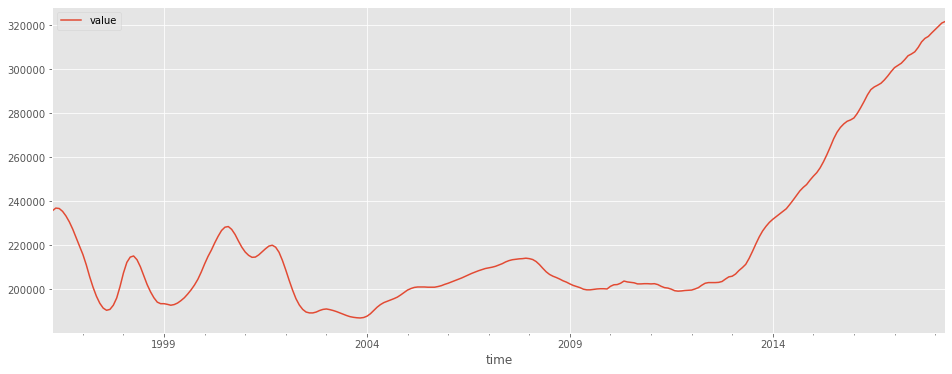

In [30]:
#visualize the data
test.plot(figsize=(16,6))
plt.show()

## 3.1 Housing Data Trends
Looking at the overall trend of this data we can see that housing prices were relatively turmultous during the late 1990 with a small but steady rise in prices between 2000 & 2008. While not a dramatic dip in prices in this housing data set the 2008 housing bubble burst did affect housing prices overall. There is about 4 years of stagnant growth in the market. Starting in 2012 there is a dramatic rise in prices over all. Since my client is looking to receive return on investment in the relatively short term (18-36 months) the housing prices pre bubble & during the recovery are not directly indicative of the current housing market and this client assumes there will be no second bubble in the short term that would need to be accounted for. Thus I am going to segment my data to include only home value prices after 2012 to build a model on. 

In [31]:
#Slice the dataframe to include only dates after 2008
test_recent = test.sort_index().loc['2015':] 
test_recent 

,value
time,
2015-01-01,251400.0
2015-02-01,253000.0
2015-03-01,255200.0
2015-04-01,258000.0
2015-05-01,261200.0
2015-06-01,264700.0
2015-07-01,268400.0
2015-08-01,271400.0
2015-09-01,273600.0


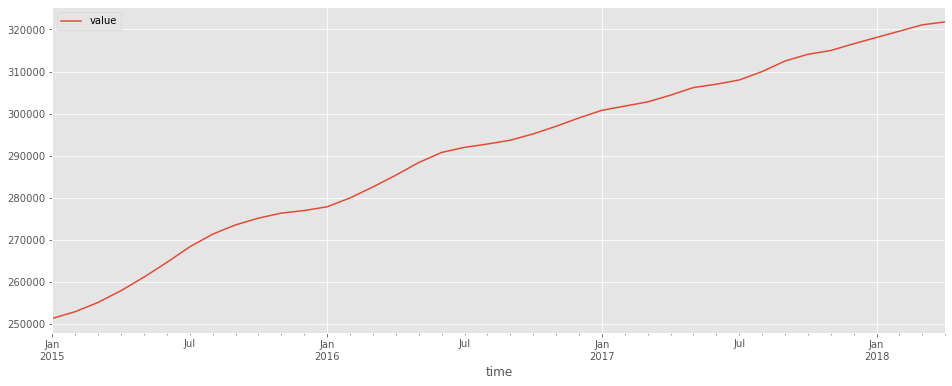

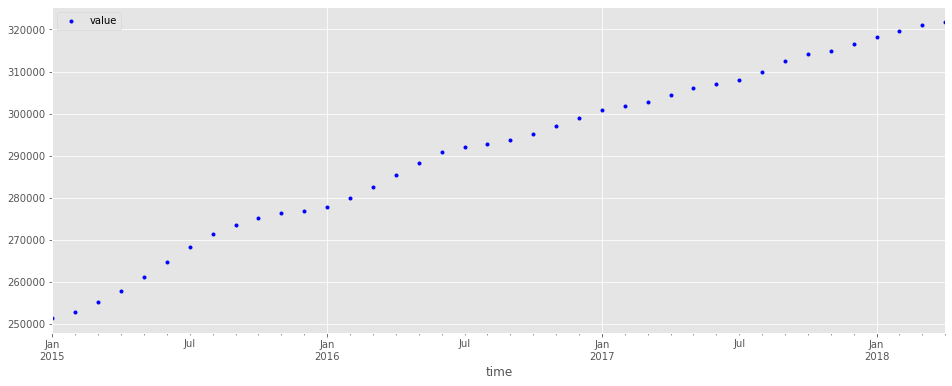

In [32]:
#revisualize data slice
test_recent.plot(figsize=(16,6))
test_recent.plot(figsize=(16,6), style = '.b') 
plt.show()

In [33]:
#print out price high/low/average/ standard deviation 
print("Min Sale Value", test_recent.min()) 
print("Max Sale Value", test_recent.max()) 
print("Monthly Mean", np.mean(test_recent))
print("Standard Deviation", np.std(test_recent))

Min Sale Value value    251400.0
dtype: float64
Max Sale Value value    321800.0
dtype: float64
Monthly Mean value    291002.5
dtype: float64
Standard Deviation value    20403.596344
dtype: float64


In [34]:
from  statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from pandas.plotting import autocorrelation_plot,lag_plot

def plot_acf_pacf(TS, figsize=(10,8),lags=24):
    
    fig,ax = plt.subplots(nrows=3,
                          figsize=figsize)
    
    ## Plot ts
    TS.plot(ax=ax[0])
    
    ## Plot acf, pavf
    plot_acf(TS,ax=ax[1],lags=lags)
    plot_pacf(TS, ax=ax[2],lags=lags) 
    fig.tight_layout()
    
    return fig

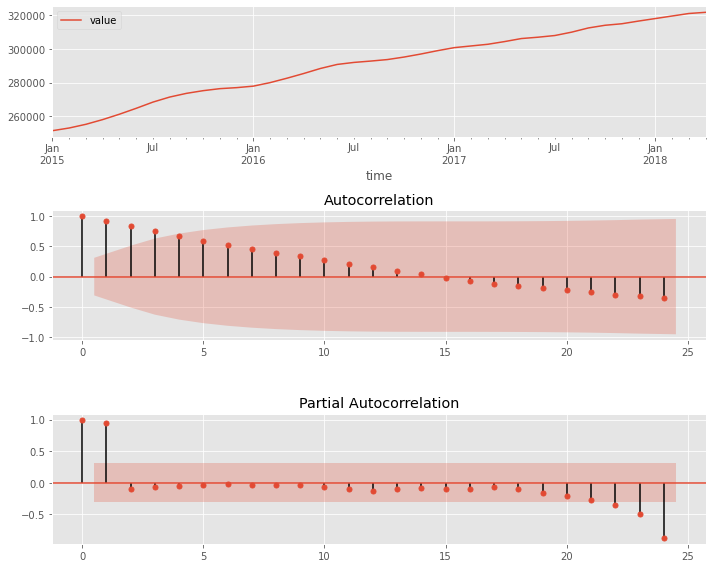

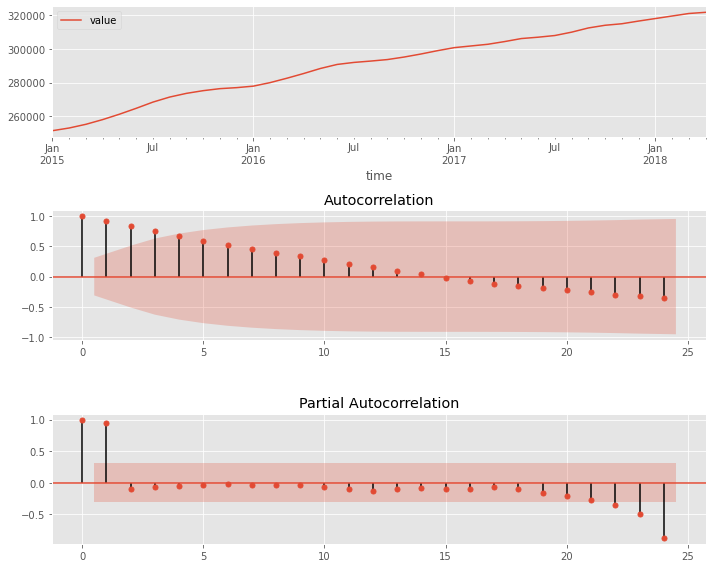

In [35]:
plot_acf_pacf(test_recent, figsize=(10,8),lags=24)

In [36]:
# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets
pdqs = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

In [37]:
# Run a grid with pdq and seasonal pdq parameters calculated above and get the best AIC value
ans = []
for comb in pdq:
    for combs in pdqs:
        try:
            mod = sm.tsa.statespace.SARIMAX(test_recent,
                                            order=comb,
                                            seasonal_order=combs,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            output = mod.fit()
            ans.append([comb, combs, output.aic])
            print('ARIMA {} x {}12 : AIC Calculated ={}'.format(comb, combs, output.aic))
        except:
            continue

ARIMA (0, 0, 0) x (0, 0, 0, 12)12 : AIC Calculated =1094.4505706062866
ARIMA (0, 0, 0) x (0, 0, 1, 12)12 : AIC Calculated =933.2203514386647
ARIMA (0, 0, 0) x (0, 1, 0, 12)12 : AIC Calculated =616.0912681184143
ARIMA (0, 0, 0) x (0, 1, 1, 12)12 : AIC Calculated =339.73964530626296
ARIMA (0, 0, 0) x (1, 0, 0, 12)12 : AIC Calculated =557.9015035864244
ARIMA (0, 0, 0) x (1, 0, 1, 12)12 : AIC Calculated =1627.9638768070588
ARIMA (0, 0, 0) x (1, 1, 0, 12)12 : AIC Calculated =297.3884639178384
ARIMA (0, 0, 0) x (1, 1, 1, 12)12 : AIC Calculated =293.2329113722076
ARIMA (0, 0, 1) x (0, 0, 0, 12)12 : AIC Calculated =1042.1531076706108
ARIMA (0, 0, 1) x (0, 0, 1, 12)12 : AIC Calculated =738359.0127877966
ARIMA (0, 0, 1) x (0, 1, 0, 12)12 : AIC Calculated =579.0523014679904
ARIMA (0, 0, 1) x (0, 1, 1, 12)12 : AIC Calculated =318.3361515019612
ARIMA (0, 0, 1) x (1, 0, 0, 12)12 : AIC Calculated =762.8826002187895
ARIMA (0, 0, 1) x (1, 0, 1, 12)12 : AIC Calculated =710.8152467707417
ARIMA (0, 0, 1) 

In [38]:
# Find the parameters with minimal AIC value
ans_df = pd.DataFrame(ans, columns=['pdq', 'pdqs', 'aic']) 
results = dict(ans_df.loc[ans_df['aic'].idxmin()])

In [39]:
# Plug the optimal parameter values into a new SARIMAX model
ARIMA_MODEL = sm.tsa.statespace.SARIMAX(test_recent, 
                                        order=results['pdq'], 
                                        seasonal_order=results['pdqs'], 
                                        enforce_stationarity=False, 
                                        enforce_invertibility=False)

# Fit the model and print results
output = ARIMA_MODEL.fit()

print(output.summary().tables[1])


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          1.0000      0.353      2.836      0.005       0.309       1.691
ma.S.L12      -0.0604      0.232     -0.260      0.795      -0.515       0.394
sigma2      2.994e+05   1.18e-06   2.54e+11      0.000    2.99e+05    2.99e+05


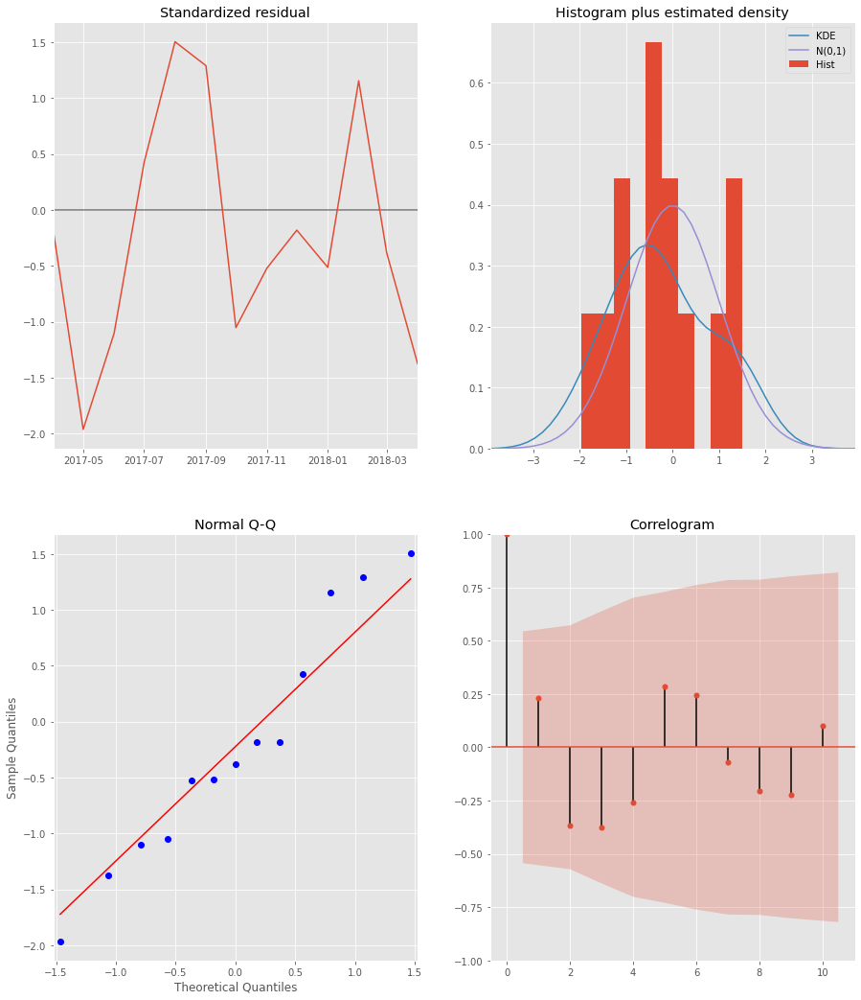

In [40]:
# Call plot_diagnostics() on the results calculated above 
output.plot_diagnostics(figsize=(15, 18))
plt.show()

In [41]:
# Get predictions starting from and calculate confidence intervals
pred = output.get_prediction(start=pd.to_datetime('2015-01-01'), dynamic=False)
pred_conf = pred.conf_int()

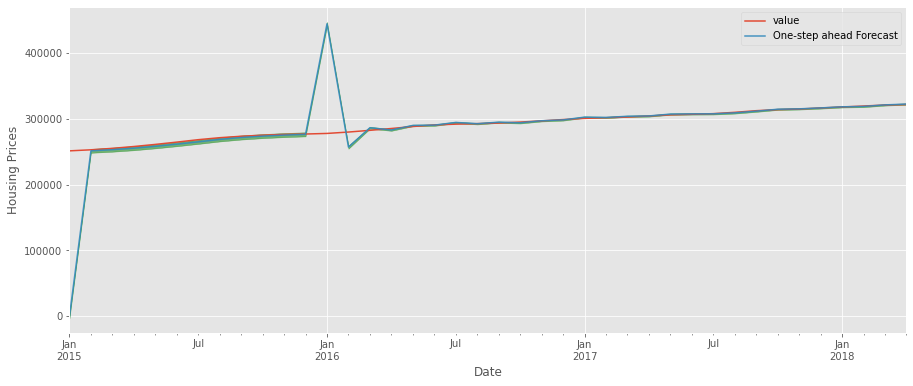

In [42]:
# Plot real vs predicted values along with confidence interval

rcParams['figure.figsize'] = 15, 6

# Plot observed values
ax = test_recent[:2015].plot(label='observed')

# Plot predicted values
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=0.9)

# Plot the range for confidence intervals
ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1], color='g', alpha=0.5)

# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Housing Prices')
plt.legend()

plt.show()

In [43]:
test_recent

,value
time,
2015-01-01,251400.0
2015-02-01,253000.0
2015-03-01,255200.0
2015-04-01,258000.0
2015-05-01,261200.0
2015-06-01,264700.0
2015-07-01,268400.0
2015-08-01,271400.0
2015-09-01,273600.0


In [44]:
## Getting a forecast
forecast = output.get_forecast(len(test_recent))
test_pred = forecast.conf_int()
test_pred['value'] = forecast.predicted_mean
test_pred.columns = ['lower','upper','prediction'] 
test_pred

,lower,upper,prediction
2018-05-01,321842.340026,324028.591007,322935.465516
2018-06-01,321428.435207,326243.278631,323835.856919
2018-07-01,321632.404149,328081.104869,324856.754509
2018-08-01,322919.395672,330664.637099,326792.016385
2018-09-01,324772.930966,333626.844708,329199.887837
2018-10-01,325874.911426,335713.346886,330794.129156
2018-11-01,326379.252052,337112.277548,331745.764800
2018-12-01,327589.458976,339148.042719,333368.750848
2019-01-01,328727.495316,341056.481320,334891.988318
2019-02-01,329842.590476,342896.588217,336369.589346


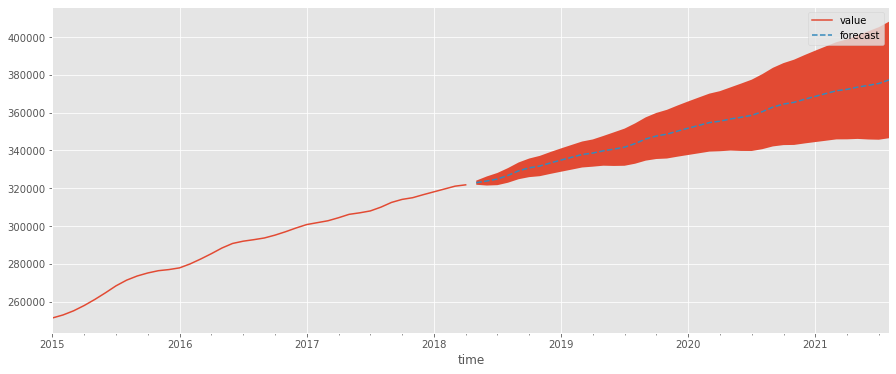

In [45]:
fig, ax = plt.subplots()
test_recent.plot(ax=ax,label='values')
#test.plot(ax=ax,label='test')

test_pred['prediction'].plot(ax=ax,label='forecast',ls='--')

ax.fill_between(x=test_pred.index,y1=test_pred['lower'],y2=test_pred['upper'])
ax.legend() 
plt.show()

# 5 - Modeling - All Zipcode 
Modeling though all zipcodes in the Dallas Fort Worth Metroplex in high preforming school districts.

75070
Min Sale Value value    251400.0
dtype: float64
Max Sale Value value    321800.0
dtype: float64
Monthly Mean value    291002.5
dtype: float64
Standard Deviation value    20403.596344
dtype: float64
{'pdq': (0, 1, 1), 'pdqs': (0, 1, 1, 12), 'aic': 208.77623352546513}
                    lower          upper     prediction
2018-05-01  321842.340026  324028.591007  322935.465516
2018-06-01  321428.435207  326243.278631  323835.856919
2018-07-01  321632.404149  328081.104869  324856.754509
2018-08-01  322919.395672  330664.637099  326792.016385
2018-09-01  324772.930966  333626.844708  329199.887837
2018-10-01  325874.911426  335713.346886  330794.129156
2018-11-01  326379.252052  337112.277548  331745.764800
2018-12-01  327589.458976  339148.042719  333368.750848
2019-01-01  328727.495316  341056.481320  334891.988318
2019-02-01  329842.590476  342896.588217  336369.589346
2019-03-01  330974.715167  344715.525922  337845.120544
2019-04-01  331406.420843  345801.312417  338603.866630

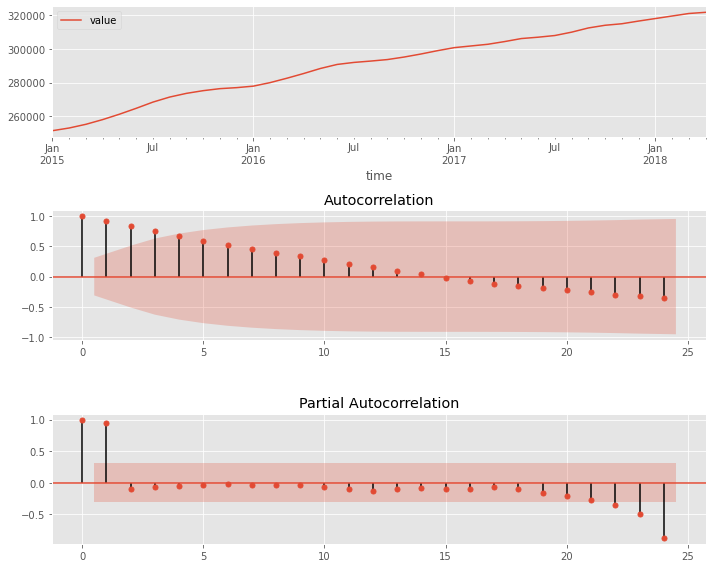

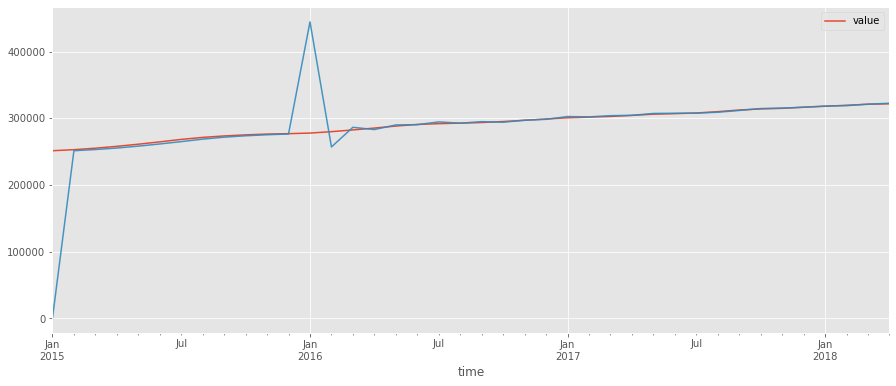

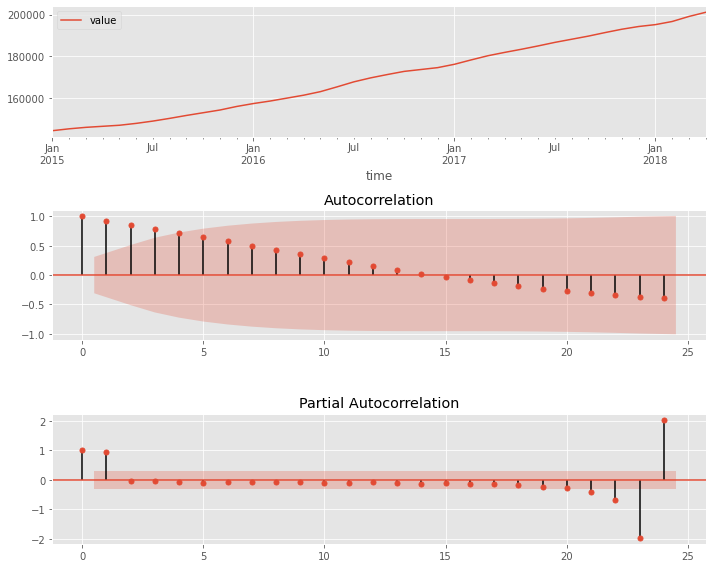

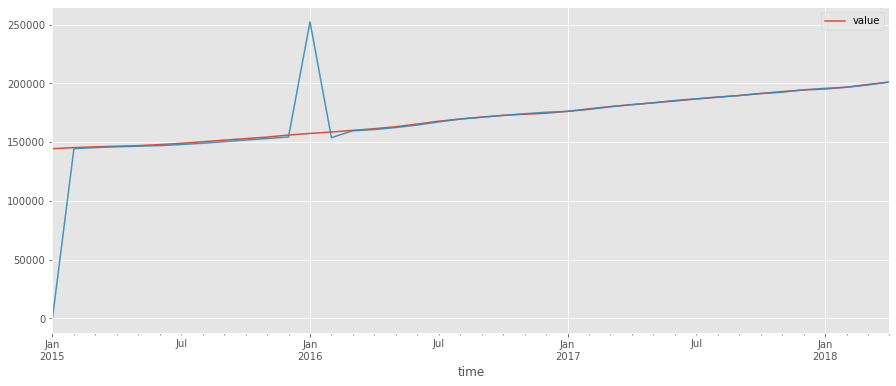

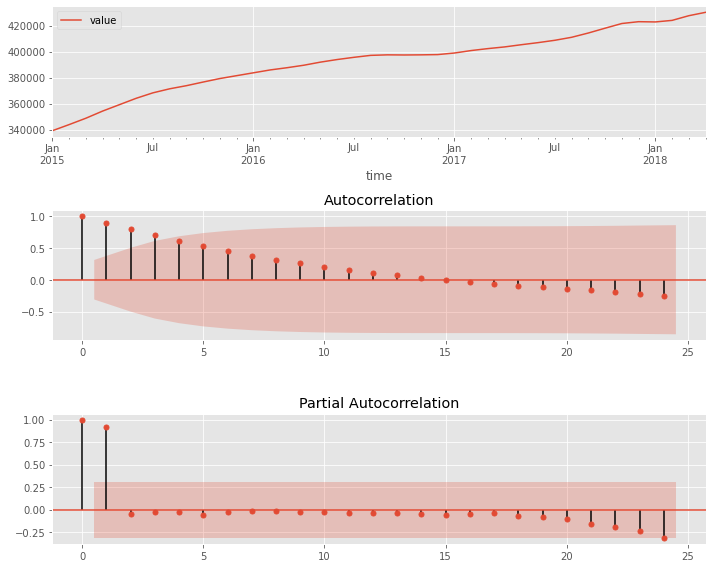

...

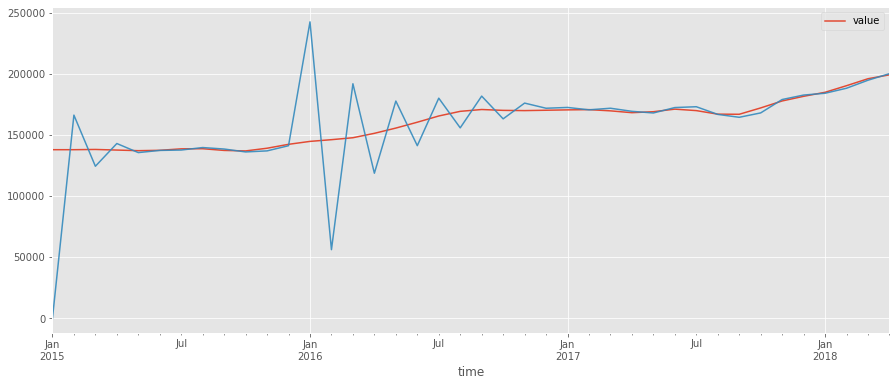

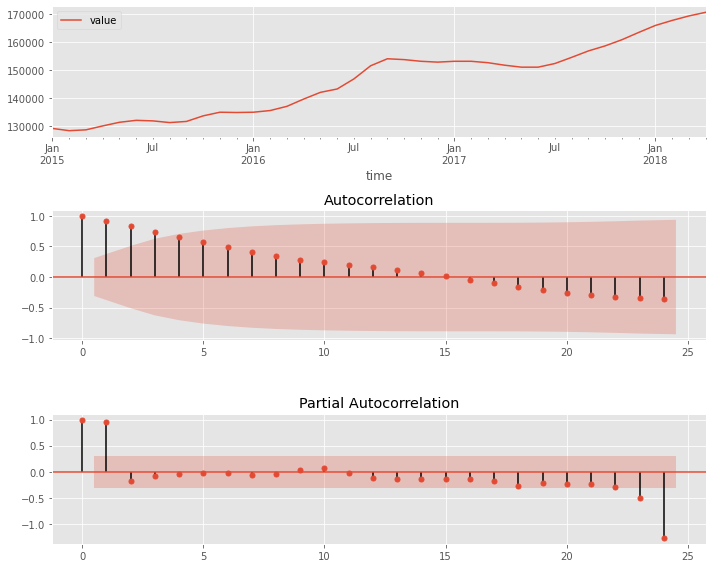

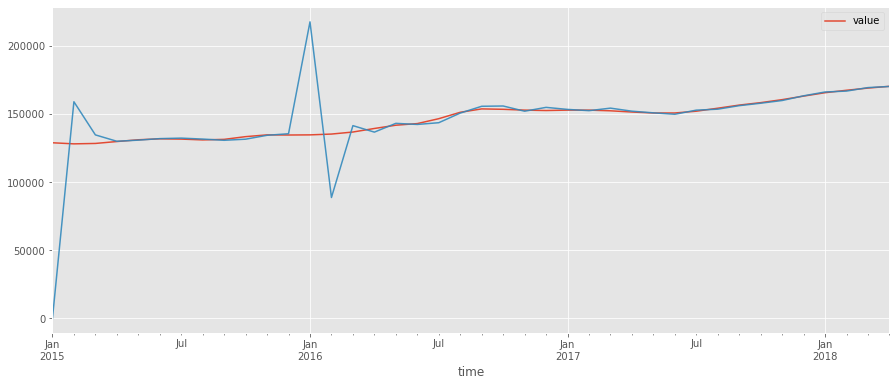

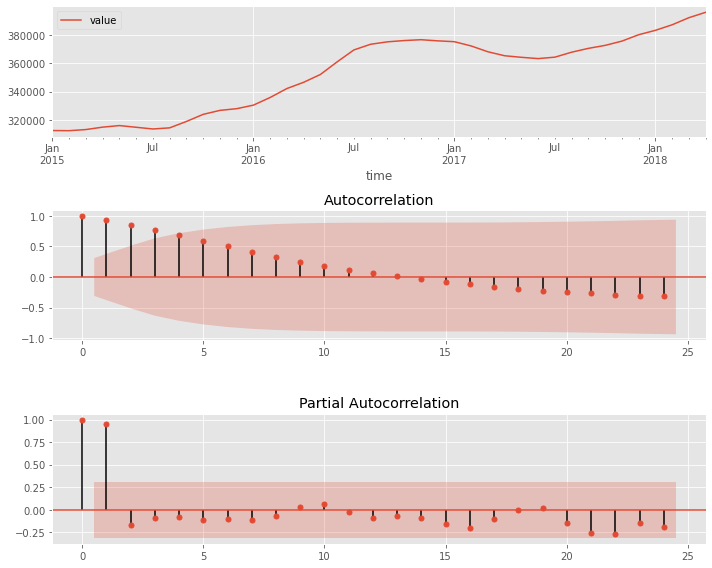

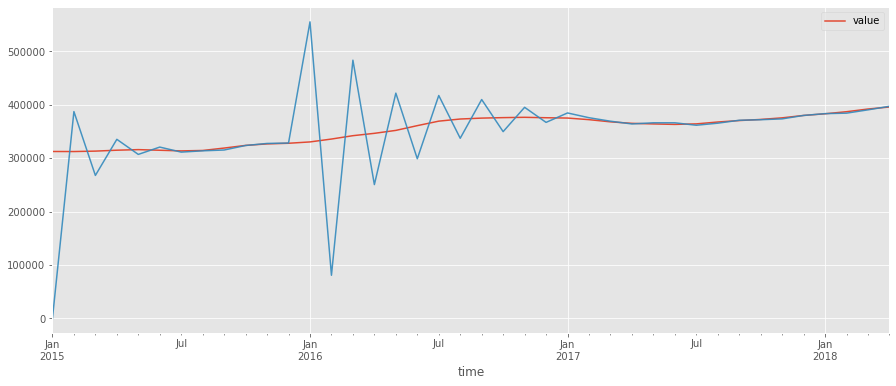

In [47]:
#visualize the time series for each zipcode
preditctions = {}
for region in zip_list:   
    
    # get a single zipcode from the dataframe
    single_zip = dallas.groupby('RegionName').get_group(region)  
    print(region) 
    
    #drop the regionname
    only_int = single_zip.drop(['RegionName'], 1)  
    melted_data = melt_data(only_int)  
    
    test_recent = melted_data.sort_index().loc['2015':]  
    
    #print out price high/low/average/ standard deviation 
    print("Min Sale Value", test_recent.min()) 
    print("Max Sale Value", test_recent.max()) 
    print("Monthly Mean", np.mean(test_recent))
    print("Standard Deviation", np.std(test_recent))
          
    ## Train Test Split Index
    train_size = 0.8
    split_idx = round(len(test)* train_size)
    train = test_recent.iloc[:split_idx]
    test = test_recent.iloc[split_idx:]

    #visualize the acf/pacf of the data  
    plot_acf_pacf(test_recent, figsize=(10,8),lags=24) 
          
    # Define the p, d and q parameters to take any value between 0 and 2
    p = d = q = range(0, 2)

    # Generate all different combinations of p, q and q triplets
    pdq = list(itertools.product(p, d, q))

    # Generate all different combinations of seasonal p, q and q triplets
    pdqs = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))] 
          
    # Run a grid with pdq and seasonal pdq parameters calculated above and get the best AIC value
    ans = []
    for comb in pdq:
        for combs in pdqs:
            try:
                mod = sm.tsa.statespace.SARIMAX(test_recent,
                                                order=comb,
                                                seasonal_order=combs,
                                                enforce_stationarity=False,
                                                enforce_invertibility=False)

                output = mod.fit()
                ans.append([comb, combs, output.aic])
            except:
                continue  
          
    # Find the parameters with minimal AIC value
    ans_df = pd.DataFrame(ans, columns=['pdq', 'pdqs', 'aic'])
    results = dict(ans_df.loc[ans_df['aic'].idxmin()])  
    print(results)
          
    # Plug the optimal parameter values into a new SARIMAX model
    ARIMA_MODEL = sm.tsa.statespace.SARIMAX(test_recent, 
                                        order=results['pdq'], 
                                        seasonal_order=results['pdqs'], 
                                        enforce_stationarity=False, 
                                        enforce_invertibility=False)

    # Fit the model and print results
    output = ARIMA_MODEL.fit()
          
    # Get predictions starting from and calculate confidence intervals
    pred = output.get_prediction(start=pd.to_datetime('2015-01-01'), dynamic=False)
    pred_conf = pred.conf_int() 
          
    # Plot real vs predicted values along with confidence interval

    rcParams['figure.figsize'] = 15, 6

    # Plot observed values
    ax = test_recent[:2014].plot(label='observed')

    # Plot predicted values
    pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=0.9)

          
    # Get the real and predicted values
    price_forecasted = pred.predicted_mean
    price_truth = test_recent['2015-01-01':]
          
    ## Getting a forecast
    forecast = output.get_forecast(len(test_recent))

    test_pred = forecast.conf_int()
    test_pred['value'] = forecast.predicted_mean
    test_pred.columns = ['lower','upper','prediction']
    print(test_pred) 

# 6 - Recommendations  
My client is looking to buy low sell high in a 18 -36 month window the most recent data in this dataset is from April 2018 so I will use that date as the date of purchase on ROI calculations - October of 2019/ April 2021

In [57]:
#create a dataframe that displays roi given an April 2018 buy & either 10/19 or 04/21 sell 
roi_df = dallas[['RegionName', '2018-04']] 


,RegionName,2018-04
1,75070,321800
34,75052,201100
52,75034,430200
81,75067,241800
153,76063,267800
...,...,...
9171,75167,283700
9388,76043,229700
9851,76050,199400
9872,75135,170600


In [108]:
#predicted values for october 2019
october_twentynineteen = [347642.56, 229965.50, 470309.16, 280078.27, 291181.78, 256537.43, 292836.43, 
                                     393375.05, 311846.32, 225410.72, 224783.75, 378825.36, 261707.29, 455435.11, 
                                     361373.51, 345462.55, 269781.44, 307490.92, 446337.60, 385872.06, 263818.06, 
                                     397677.02, 219518.69, 440049.58, 276785.76, 370114.22, 203202.66, 351149.02, 
                                     349275.84, 243822.92, 273868.80, 323770.92, 416161.35, 295382.74, 323600.56, 
                                     292905.52, 224064.91, 448759.18, 409393.77, 216827.73, 339301.22, 285278.79, 
                                     164048.10, 253408.45, 292706.46, 244674.82, 205407.21, 215187.74, 1327901.00, 
                                     421989.18, 683251.64, 1182523.00, 256242.33, 523578.04, 292895.18, 388562.62, 
                                     199023.14, 297833.26, 451045.04, 219212.36, 287184.86, 428704.15, 236963.51, 
                                     335421.62, 275162.01, 221257.45, 219995.71, 255921.66, 240600.05, 246763.39, 
                                     416306.34, 309279.20, 307745.02, 342255.76, 238610.62, 243419.54, 200871.50, 
                                     458162.45]   
roi_df['2019-10-01'] = october_twentynineteen

In [109]:
#predicted values fro april 2021
april_twentytwentyone = [372300.72, 258866.46, 508736.31, 316006.20, 316975.57, 262486.01, 317860.48, 417953.25,
                         336827.64, 247002.21, 49913.23, 409559.63, 269616.25, 456632.99, 349464.85, 378487.10, 
                         305351.51, 341904.48, 473815.93, 390391.53, 302931.39, 360837.59, 50781.77, 450826.52, 
                         291434.48, 402191.32, 197847.32, 392933.05, 278612.16, 274630.60, 299576.72, 368380.68, 
                         445357.82, 315940.21, 342456.48, 319896.39, 248485.79, 493845.45, 422359.65, 247049.27, 
                         366397.26, 311825.19, 190784.66, 286965.05, 306853.89, 273298.24, 237587.09, 249022.53, 
                         1387747.00, 440115.20, 718886.22, 1206818.00, 293078.64, 558136.03, 314039.40, 428322.55, 
                         233480.98, 320842.11, 477897.51, 222644.35, 11534.52, 483634.49, 278422.38, 364940.91, 
                         296046.49, 257621.74, 253576.66, 267759.28, 288185.12, 276391.61, 480611.43, 335529.74, 
                         340844.06, 402647.10, 241685.58, 303024.44, 231077.64, 527892.47] 
roi_df['2021-04-01'] = april_twentytwentyone

In [110]:
#calculate & add roi 
roi_df['18mo_roi'] =  roi_df['2019-10-01'] - roi_df['2018-04'] 
roi_df['36mo_roi'] =  roi_df['2021-04-01'] - roi_df['2018-04'] 

In [111]:
roi_df

,RegionName,2018-04,2019-10-01,2021-04-01,18mo_roi,36mo_roi
1,75070,321800,347642.56,372300.72,25842.56,50500.72
34,75052,201100,229965.50,258866.46,28865.50,57766.46
52,75034,430200,470309.16,508736.31,40109.16,78536.31
81,75067,241800,280078.27,316006.20,38278.27,74206.20
153,76063,267800,291181.78,316975.57,23381.78,49175.57
...,...,...,...,...,...,...
9171,75167,283700,342255.76,402647.10,58555.76,118947.10
9388,76043,229700,238610.62,241685.58,8910.62,11985.58
9851,76050,199400,243419.54,303024.44,44019.54,103624.44
9872,75135,170600,200871.50,231077.64,30271.50,60477.64


In [112]:
#best 18 month roi zips 
roi_df.loc[roi_df['18mo_roi'] > 50000] 

,RegionName,2018-04,2019-10-01,2021-04-01,18mo_roi,36mo_roi
4287,75205,1268600,1327901.00,1387747.00,59301.00,119147.00
6201,75094,378000,428704.15,483634.49,50704.15,105634.49
7654,75009,359200,416306.34,480611.43,57106.34,121411.43
9171,75167,283700,342255.76,402647.10,58555.76,118947.10
10798,75182,395800,458162.45,527892.47,62362.45,132092.47


In [121]:
#best 36 month roi zips 
best_rois= roi_df.loc[roi_df['36mo_roi'] > 105000]  
best_rois

,RegionName,2018-04,2019-10-01,2021-04-01,18mo_roi,36mo_roi
4287,75205,1268600,1327901.00,1387747.00,59301.00,119147.00
6201,75094,378000,428704.15,483634.49,50704.15,105634.49
7654,75009,359200,416306.34,480611.43,57106.34,121411.43
9171,75167,283700,342255.76,402647.10,58555.76,118947.10
10798,75182,395800,458162.45,527892.47,62362.45,132092.47


The zipcodes with the higheest ROIs for both the 18 month and the 36 month forcast are the same which makes the recommendation clear. The best zipcodes to buy in in Dallas would be: 75205, 75094, 75009, 75167, 75182. 

# 7 - Market Picture of Best Buys 
Give a holistic picture of the zipcodes in the recommendation 

In [90]:
df2.loc[df2['Zipcode'] == '75205'] 

,Grade,Zipcode,SchoolDistrict
11,A+,75205,Highland Park ISD


In [102]:
zip_viz = dallas.loc[dallas['RegionName'] == 75205]  

In [91]:
df2.loc[df2['Zipcode'] == '75094']

,Grade,Zipcode,SchoolDistrict
16,A+,75094,Wylie ISD


In [95]:
dallas.loc[dallas['RegionName'] == 75009] 
#Celina School A-

,RegionName,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,1996-11,1996-12,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
7654,75009,186300.0,185200.0,184100.0,183000.0,182000.0,181100.0,180300.0,179700.0,179200.0,...,326500,329200,331800,334500,337700,340800,343200,348000,355000,359200


In [97]:
df2.loc[df2['Zipcode'] == '75167']

,Grade,Zipcode,SchoolDistrict
70,A-,75167,Waxahachie ISD


In [99]:
dallas.loc[dallas['RegionName'] == 75182] 
#sunnyvale isd A+

,RegionName,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,1996-11,1996-12,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
10798,75182,207300.0,207500.0,207700.0,207900.0,208100.0,208300.0,208600.0,208700.0,208700.0,...,364200,367700,370400,372500,375500,380000,383100,387000,392000,395800


In [129]:
best_rois

,RegionName,2018-04,2019-10-01,2021-04-01,18mo_roi,36mo_roi
4287,75205,1268600,1327901.00,1387747.00,59301.00,119147.00
6201,75094,378000,428704.15,483634.49,50704.15,105634.49
7654,75009,359200,416306.34,480611.43,57106.34,121411.43
9171,75167,283700,342255.76,402647.10,58555.76,118947.10
10798,75182,395800,458162.45,527892.47,62362.45,132092.47


In [146]:
import plotly.express as px
zipcode=['75205', '75094', '75009', '75167', '75182']

fig = go.Figure(data=[
    go.Bar(name='18 Month ROI', x=zipcode, y=[59301.00, 50704.15, 57106.34, 58555.76, 62362.45]),
    go.Bar(name='36 Month ROI', x=zipcode, y=[119147, 105634.49, 121411.43, 118947.10, 132092.47])
])
# Change the bar mode
fig.update_layout(barmode='group') 
fig.update_layout(title='Top 5 ROIS by Zipcode')
fig.update_xaxes(type='category') 
fig.show()